<a href="https://colab.research.google.com/github/yrodriguezmd/IceVision_miniprojects/blob/main/IV_plantdoc_git_customparser_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<a href="https://colab.research.google.com/github/airctic/icedata/blob/master/notebooks/dev/plantdoc.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!wget https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
!bash install_colab.sh

In [ ]:
from icevision.all import *

In [ ]:
!git clone https://github.com/pratikkayal/PlantDoc-Object-Detection-Dataset.git

In [3]:
%pwd

'/content'

In [4]:
!ls

'=5.1'	 install_colab.sh   PlantDoc-Object-Detection-Dataset   sample_data


In [5]:
# Change current directory
%cd PlantDoc-Object-Detection-Dataset/

/content/PlantDoc-Object-Detection-Dataset


In [6]:
!ls

LICENSE.txt  TEST  test_labels.csv  TRAIN  train_labels.csv


In [7]:
import pandas as pd

annot = pd.read_csv('train_labels.csv')
annot.rename(columns={'class':'label'}, inplace=True) # to avoid semantic conflicts
annot.sample(5)

,filename,width,height,label,xmin,ymin,xmax,ymax
5398,BacterialSpot17.jpg,300,450,Bell_pepper leaf spot,57,328,122,417
7315,dsc00849.jpg,5456,3632,grape leaf,2286,134,3038,618
7087,img_6564.jpg,3612,2365,Tomato Septoria leaf spot,874,811,1672,1542
4255,cherry-leaves-e1335624103663.jpg,2000,2666,Cherry leaf,1,924,821,1493
7755,tomato-leaf-herbicide-damage.jpg,500,375,Tomato leaf mosaic virus,120,286,189,364


In [8]:
annot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8469 entries, 0 to 8468
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  8469 non-null   object
 1   width     8469 non-null   int64 
 2   height    8469 non-null   int64 
 3   label     8469 non-null   object
 4   xmin      8469 non-null   int64 
 5   ymin      8469 non-null   int64 
 6   xmax      8469 non-null   int64 
 7   ymax      8469 non-null   int64 
dtypes: int64(6), object(2)
memory usage: 529.4+ KB


In [9]:
annot.filename.nunique()
# paper: 2,598 data points

2345

In [10]:
len(annot.label.unique().tolist())
# paper: 13 plant species, 17 classes of diseases

29

In [12]:
_CLASSES = annot["label"].unique().tolist()
_CLASSES

['Cherry leaf',
 'Peach leaf',
 'Corn leaf blight',
 'Apple rust leaf',
 'Potato leaf late blight',
 'Strawberry leaf',
 'Corn rust leaf',
 'Tomato leaf late blight',
 'Tomato mold leaf',
 'Potato leaf early blight',
 'Apple leaf',
 'Tomato leaf yellow virus',
 'Blueberry leaf',
 'Tomato leaf mosaic virus',
 'Raspberry leaf',
 'Tomato leaf bacterial spot',
 'Squash Powdery mildew leaf',
 'grape leaf',
 'Corn Gray leaf spot',
 'Tomato Early blight leaf',
 'Apple Scab Leaf',
 'Tomato Septoria leaf spot',
 'Tomato leaf',
 'Soyabean leaf',
 'Bell_pepper leaf spot',
 'Bell_pepper leaf',
 'grape leaf black rot',
 'Potato leaf',
 'Tomato two spotted spider mites leaf']

The dataset obtained through git clone has 8,469 entries composed of 2,345 images containing 11 healthy and 18 diseased classes.


In [14]:
class_map = ClassMap(_CLASSES)

class_map.get_by_name('Strawberry leaf') # to be used in parser

6

In [29]:
template_record = ObjectDetectionRecord()

In [76]:
#!ls

checkpoints  models  test_labels.csv  train_labels.csv
LICENSE.txt  TEST    TRAIN


In [102]:
data_dir = Path(".") # the csv file is separate from the TRAIN folder

In [103]:
class PlantDocParser(Parser):
    def __init__(self, template_record, data_dir):
        super().__init__(template_record=template_record)

        self.data_dir = data_dir
        self.df = annot
        self.class_map = class_map

    def __iter__(self) -> Any:
        for o in self.df.itertuples():
            yield o

    def __len__(self) -> int:
        return len(self.df)

    def record_id(self, o) -> Hashable:
        return o.filename

    def parse_fields(self, o, record, is_new):
        if is_new:
            filepath = self.data_dir / 'TRAIN' / o.filename
            record.set_filepath(filepath)
            if filepath.exists():
              image_size = get_img_size(filepath)
              record.set_img_size(image_size) #
            record.detection.set_class_map(self.class_map)

        record.detection.add_bboxes([BBox.from_xyxy(o.xmin, o.ymin, o.xmax, o.ymax)])
        record.detection.add_labels([o.label])

In [104]:
parser_csv = PlantDocParser(template_record, data_dir)

train_records_csv, valid_records_csv = parser_csv.parse()

  0%|          | 0/8469 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:136


  0%|          | 0/1876 [00:00<?, ?it/s]

AUTOFIX-SUCCESS - (record_id: 1363) - Clipping bbox xmax from 3806 to image width 2592 (Before: <BBox (xmin:1, ymin:86, xmax:3806, ymax:2430)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 479) - Clipping bbox ymax from 479 to image height 332 (Before: <BBox (xmin:3, ymin:1, xmax:472, ymax:479)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 479) - Clipping bbox xmax from 640 to image width 598 (Before: <BBox (xmin:411, ymin:1, xmax:640, ymax:238)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 1832) - Clipping bbox xmax from 2267 to image width 2091 (Before: <BBox (xmin:989, ymin:160, xmax:2267, ymax:1174)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 2018) - Clipping bbox xmax from 2255 to image width 1936 (Before: <BBox (xmin:1961, ymin:97, xmax:2255, ymax:843)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-FAIL - (record_id: 2018) - Cannot auto-fix coo

  0%|          | 0/469 [00:00<?, ?it/s]

WARNING  - (record_id: 2282) - 🚫 Record could not be autofixed and will be removed because: File 'TRAIN/powdery-mildew-on-squash-leaves.jpg' does not exist | icevision.core.record:autofix_records:104


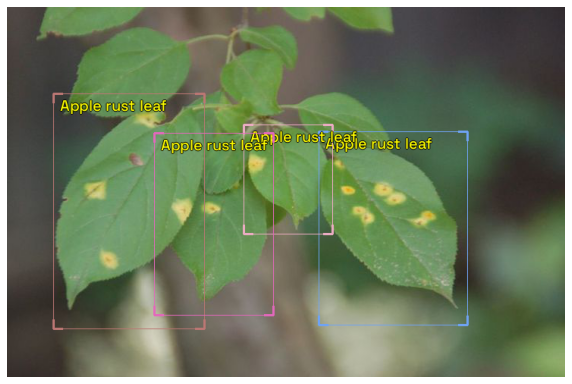

In [111]:
show_record(train_records_csv[4], class_map=class_map, 
            figsize = (10,10),font_size=20, label_color = '#ffff00')

In [112]:
train_records_csv[4]

BaseRecord

common: 
	- Record ID: 2014
	- Filepath: TRAIN/a82e389f8b5da4758a747c32ef8af6f9--rust-apples.jpg
	- Img: None
	- Image size ImgSize(width=736, height=488)
detection: 
	- Class Map: <ClassMap: {'background': 0, 'Cherry leaf': 1, 'Peach leaf': 2, 'Corn leaf blight': 3, 'Apple rust leaf': 4, 'Potato leaf late blight': 5, 'Strawberry leaf': 6, 'Corn rust leaf': 7, 'Tomato leaf late blight': 8, 'Tomato mold leaf': 9, 'Potato leaf early blight': 10, 'Apple leaf': 11, 'Tomato leaf yellow virus': 12, 'Blueberry leaf': 13, 'Tomato leaf mosaic virus': 14, 'Raspberry leaf': 15, 'Tomato leaf bacterial spot': 16, 'Squash Powdery mildew leaf': 17, 'grape leaf': 18, 'Corn Gray leaf spot': 19, 'Tomato Early blight leaf': 20, 'Apple Scab Leaf': 21, 'Tomato Septoria leaf spot': 22, 'Tomato leaf': 23, 'Soyabean leaf': 24, 'Bell_pepper leaf spot': 25, 'Bell_pepper leaf': 26, 'grape leaf black rot': 27, 'Potato leaf': 28, 'Tomato two spotted spider mites leaf': 29}>
	- Labels: [4, 4, 4, 4]
	- B

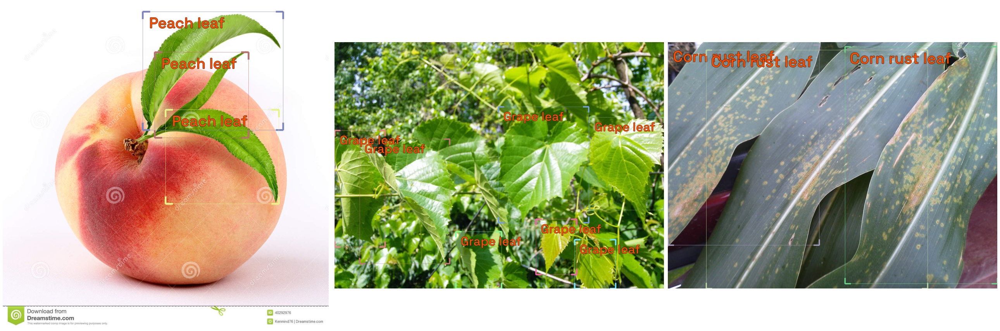

In [129]:
show_records(train_records_csv[33:36], ncols=3,
             font_size=60, label_color = '#ff5000')

In [130]:
presize = 512
image_size = 384

train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=presize), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size=image_size), tfms.A.Normalize()])

In [131]:
train_ds = Dataset(train_records_csv, train_tfms)
valid_ds = Dataset(valid_records_csv, valid_tfms)

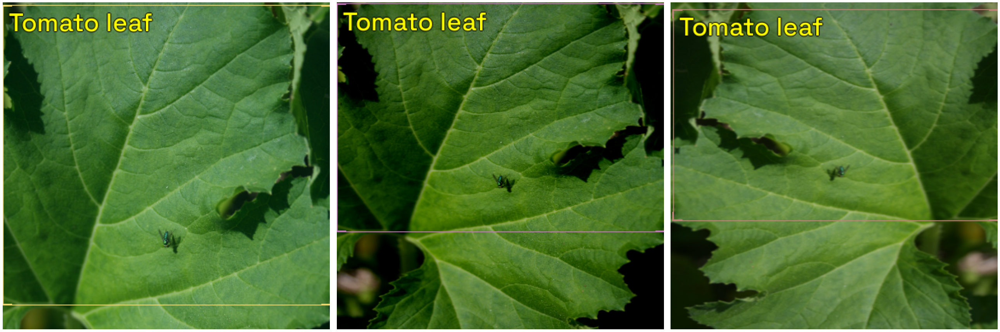

In [139]:
# visualize transformations
samples = [train_ds[7] for _ in range(3)]
show_samples(samples, ncols=3, font_size=30, label_color = '#ffff00')

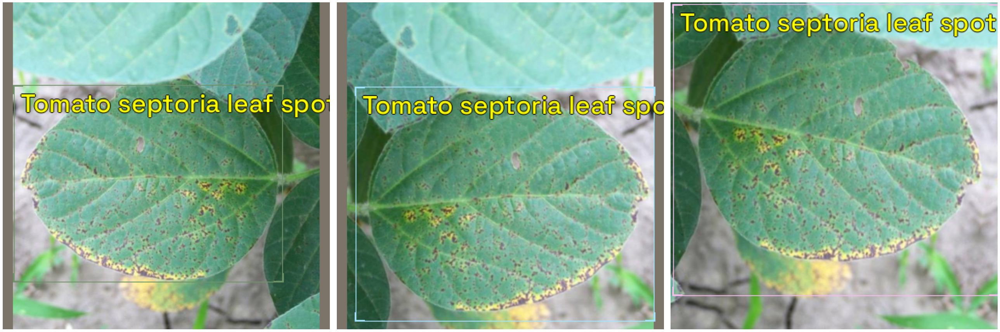

In [142]:
samples = [train_ds[10] for _ in range(3)]
show_samples(samples, ncols=3, font_size=30, label_color = '#ffff00')

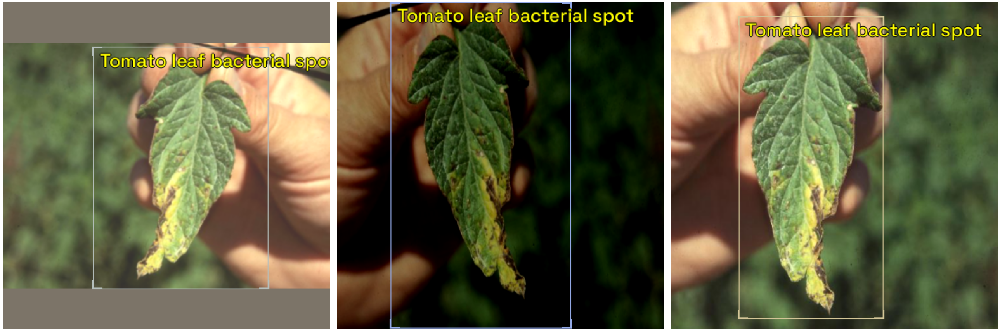

In [170]:
samples = [train_ds[38] for _ in range(3)]
show_samples(samples, ncols=3, font_size=22, label_color = '#ffff00')

In [171]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

SuggestedLRs(lr_min=0.00020892962347716094, lr_steep=3.0199516913853586e-05)

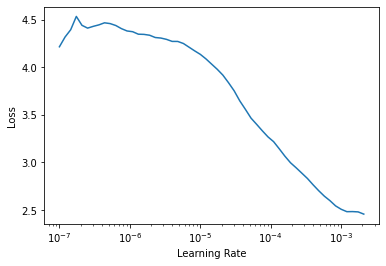

In [172]:
model_type_frcnn = models.torchvision.faster_rcnn ##
model_frcnn = model_type_frcnn.model( ##
                      num_classes=len(parser.class_map))

train_dl_frcnn = model_type_frcnn.train_dl(train_ds, ##
                      batch_size=16, num_workers=4, shuffle=True)
valid_dl_frcnn = model_type_frcnn.valid_dl(valid_ds, ##
                      batch_size=16, num_workers=4, shuffle=False)

learn_frcnn = model_type_frcnn.fastai.learner(dls=[train_dl_frcnn, ###
                                                   valid_dl_frcnn], #
                                              model=model_frcnn, metrics=metrics)#
learn_frcnn.lr_find()#

In [173]:
learn_frcnn.fine_tune(10, 2e-4, freeze_epochs=1) #

epoch,train_loss,valid_loss,COCOMetric,time
0,1.284874,0.986056,0.013715,01:16


epoch,train_loss,valid_loss,COCOMetric,time
0,0.859899,0.785644,0.043509,01:49
1,0.735228,0.693454,0.100730,01:46
2,0.669083,0.618563,0.135958,01:46
3,0.617068,0.589052,0.151737,01:46
4,0.560268,0.551114,0.188630,01:46
5,0.537816,0.537521,0.199859,01:46
6,0.493122,0.530482,0.205015,01:46
7,0.486312,0.525131,0.215197,01:46
8,0.471394,0.517620,0.222438,01:46
9,0.476686,0.517672,0.222444,01:46


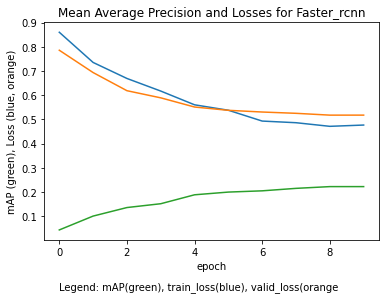

In [177]:
import matplotlib.pyplot as plt
def plot_metrics(learn, title, x, y):
  plt.plot(L(learn.recorder.values).itemgot())#
  plt.xlabel('epoch')
  plt.ylabel('mAP (green), Loss (blue, orange)')
  plt.title(title)
  plt.text(x, y, 'Legend: mAP(green), train_loss(blue), valid_loss(orange');

plot_metrics(learn_frcnn, 'Mean Average Precision and Losses for Faster_rcnn', 0,-0.2)

SuggestedLRs(lr_min=0.0033113110810518267, lr_steep=7.585775847473997e-07)

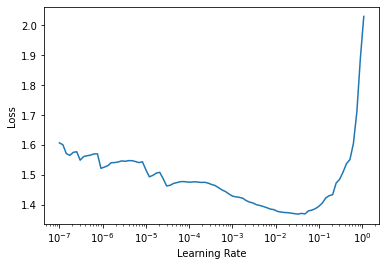

In [178]:
# using YOLOv5: 1-stage
model_type_yolo = models.ultralytics.yolov5 ##
backbone_yolo = model_type_yolo.backbones.small #
model_yolo = model_type_yolo.model(backbone = backbone_yolo(pretrained=True), ###
                      num_classes=len(parser.class_map),
                      img_size = image_size)#
train_dl_yolo = model_type_yolo.train_dl(train_ds, ##
                      batch_size=16, num_workers=4, shuffle=True)
valid_dl_yolo = model_type_yolo.valid_dl(valid_ds, ##
                      batch_size=16, num_workers=4, shuffle=False)
                                       
learn_yolo = model_type_yolo.fastai.learner(dls=[train_dl_yolo, ###
                                                   valid_dl_yolo], #
                                              model=model_yolo, metrics=metrics)#
learn_yolo.lr_find()#

In [179]:
learn_yolo.fine_tune(10, 3e-3 , freeze_epochs=1) #

epoch,train_loss,valid_loss,COCOMetric,time
0,1.213500,1.180173,0.014375,00:51


epoch,train_loss,valid_loss,COCOMetric,time
0,1.005643,0.983788,0.041103,00:52
1,0.918533,0.922711,0.053183,00:51
2,0.885406,0.863338,0.068355,00:51
3,0.836751,0.820206,0.103723,00:51
4,0.797591,0.804429,0.147628,00:51
5,0.763282,0.762813,0.189822,00:51
6,0.735903,0.749570,0.210566,00:51
7,0.701613,0.726468,0.221630,00:51
8,0.674311,0.716784,0.225594,00:52
9,0.678996,0.716928,0.229294,00:50


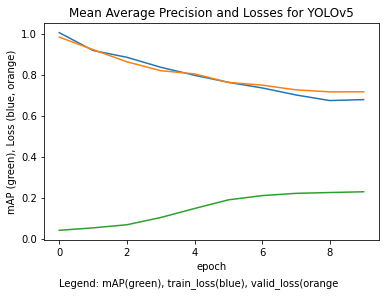

In [183]:
plot_metrics(learn_yolo, 'Mean Average Precision and Losses for YOLOv5', 0,-0.23)

/usr/local/lib/python3.7/dist-packages/mmcv/cnn/utils/weight_init.py:119: UserWarning: init_cfg without layer key, if you do not define override key either, this init_cfg will do nothing
  'init_cfg without layer key, if you do not define override'


Use load_from_local loader
The model and loaded state dict do not match exactly

size mismatch for bbox_head.retina_cls.weight: copying a param with shape torch.Size([720, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([261, 256, 3, 3]).
size mismatch for bbox_head.retina_cls.bias: copying a param with shape torch.Size([720]) from checkpoint, the shape in current model is torch.Size([261]).


SuggestedLRs(lr_min=6.918309954926372e-05, lr_steep=0.0004786300996784121)

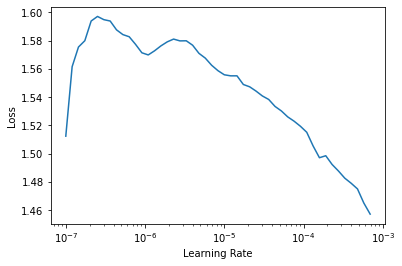

In [184]:
# using retinanet/ resnet50: focal loss
model_type_ret = models.mmdet.retinanet #
backbone_r50 = model_type_ret.backbones.resnet50_fpn_1x(pretrained=True)#
model_ret = model_type_ret.model(backbone=backbone_r50(pretrained=True), #
                      num_classes=len(parser.class_map))

train_dl_ret = model_type_ret.train_dl(train_ds, batch_size=16, num_workers=4, shuffle=True)#
valid_dl_ret = model_type_ret.valid_dl(valid_ds, batch_size=16, num_workers=4, shuffle=False)#

learn_ret = model_type_ret.fastai.learner(dls=[train_dl_ret, valid_dl_ret], model=model_ret, metrics=metrics)#
learn_ret.lr_find()#

In [185]:
learn_ret.fine_tune(10, 7e-5 , freeze_epochs=1) #

epoch,train_loss,valid_loss,COCOMetric,time
0,1.225132,1.059161,0.020943,01:14


epoch,train_loss,valid_loss,COCOMetric,time
0,0.991266,0.955717,0.036228,01:21
1,0.911161,0.880538,0.062806,01:20
2,0.839043,0.802925,0.091148,01:19
3,0.796114,0.784574,0.113694,01:19
4,0.754316,0.771567,0.127566,01:18
5,0.718500,0.734360,0.142440,01:17
6,0.692570,0.707825,0.152002,01:17
7,0.683495,0.701108,0.163184,01:16
8,0.668274,0.697768,0.164852,01:16
9,0.664858,0.699686,0.165368,01:16


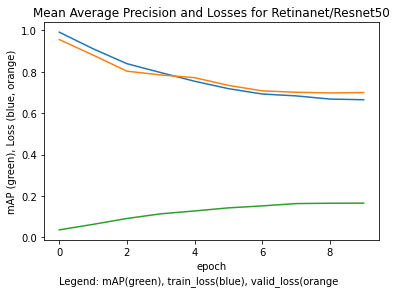

In [190]:
 plot_metrics(learn_ret, 'Mean Average Precision and Losses for Retinanet/Resnet50', 0, -0.22)

SuggestedLRs(lr_min=0.05248074531555176, lr_steep=3.311311274956097e-06)

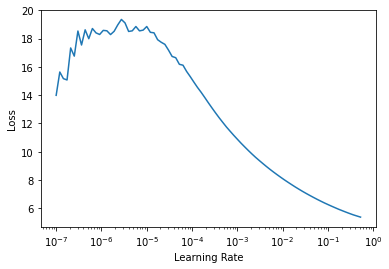

In [191]:
model_type_eff = models.ross.efficientdet ##
backbone_eff = model_type_eff.backbones.tf_lite0#
model_eff = model_type_eff.model(backbone = backbone_eff(pretrained=True), ##
                      num_classes=len(parser.class_map),
                      img_size = image_size)#
train_dl_eff = model_type_eff.train_dl(train_ds, ##
                      batch_size=16, num_workers=4, shuffle=True)
valid_dl_eff = model_type_eff.valid_dl(valid_ds, ##
                      batch_size=16, num_workers=4, shuffle=False)
                                       
learn_eff = model_type_eff.fastai.learner(dls=[train_dl_eff, ###
                                                   valid_dl_eff], #
                                              model=model_eff, metrics=metrics)#
learn_eff.lr_find()#

In [192]:
learn_eff.fine_tune(10, 5e-2, freeze_epochs=1) #

epoch,train_loss,valid_loss,COCOMetric,time
0,1.533327,2.173397,0.000472,00:59


epoch,train_loss,valid_loss,COCOMetric,time
0,1.090224,6.726329,0.015737,01:02
1,1.049146,11.402282,0.010434,01:01
2,1.028517,12.092483,0.019061,01:01
3,0.978460,2.158018,0.035497,01:01
4,0.943460,1.041199,0.043741,01:02
5,0.901716,0.967760,0.053956,01:02
6,0.857840,0.855838,0.080938,01:02
7,0.794912,0.820841,0.099100,01:02
8,0.759494,0.786461,0.116904,01:02
9,0.725145,0.761466,0.122428,01:02


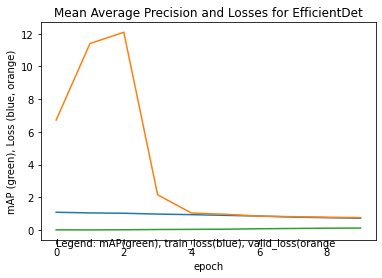

In [193]:
plot_metrics(learn_eff, 'Mean Average Precision and Losses for EfficientDet',0,-0.9)

In [194]:
# final model
model_type_yolo = models.ultralytics.yolov5 ##
backbone_yolo = model_type_yolo.backbones.small #
model_yolo = model_type_yolo.model(backbone = backbone_yolo(pretrained=True), ###
                      num_classes=len(parser.class_map),
                      img_size = image_size)#
train_dl_yolo = model_type_yolo.train_dl(train_ds, ##
                      batch_size=16, num_workers=4, shuffle=True)
valid_dl_yolo = model_type_yolo.valid_dl(valid_ds, ##
                      batch_size=16, num_workers=4, shuffle=False)
                                       
learn_yolo = model_type_yolo.fastai.learner(dls=[train_dl_yolo, ###
                                                   valid_dl_yolo], #
                                              model=model_yolo, metrics=metrics)#
#learn_yolo.lr_find()#

learn_yolo.fine_tune(30, 3e-3 , freeze_epochs=1) #
# paper: map 38.9 with Faster-rcnn inception resnet, pretrained weights COCO

epoch,train_loss,valid_loss,COCOMetric,time
0,1.228033,1.185703,0.012154,00:51


epoch,train_loss,valid_loss,COCOMetric,time
0,1.007337,0.999702,0.047862,00:52
1,0.921667,0.924953,0.085338,00:52
2,0.893633,0.878496,0.089723,00:51
3,0.859585,0.860976,0.110837,00:52
4,0.840552,0.838286,0.154862,00:51
5,0.812039,0.813712,0.157674,00:51
6,0.805769,0.776803,0.177460,00:52
7,0.781529,0.787382,0.147992,00:52
8,0.755898,0.752428,0.220128,00:52
9,0.740250,0.748325,0.189991,00:52


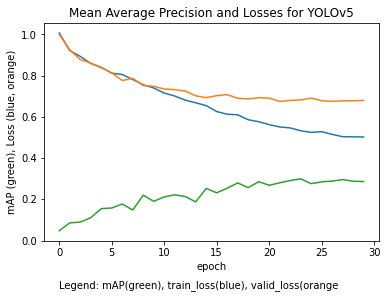

In [195]:
plot_metrics(learn_yolo, 'Mean Average Precision and Losses for YOLOv5', 0,-0.23)

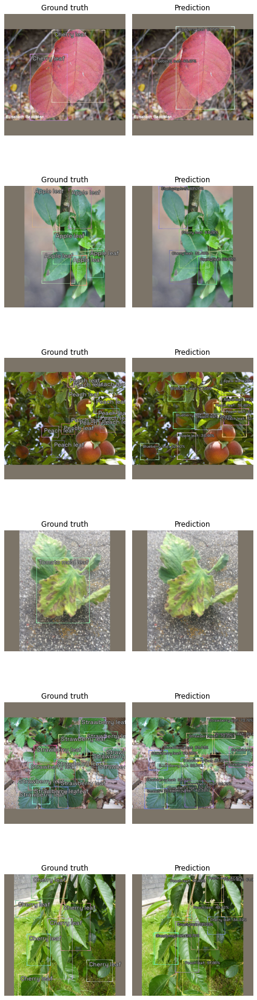

In [196]:
model_type_yolo.show_results(model_yolo, valid_ds)

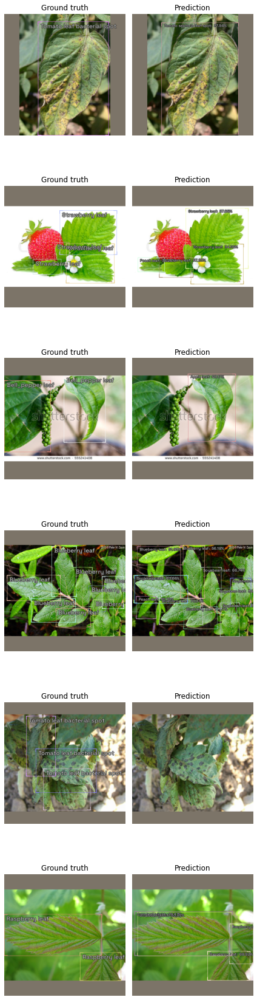

In [198]:
model_type_yolo.show_results(model_yolo, valid_ds)

In [204]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
root_dir = Path('/content/gdrive/My Drive/')

Mounted at /content/gdrive


>Note: Assuming the presence of a folder called **models** in your Google Drive

In [205]:
fname_model = 'plantdoc-yolov5.pth'
torch.save(model.state_dict(), root_dir/'models'/fname_model)

## Happy Learning!

If you need any assistance, feel free to join our [forum](https://discord.gg/JDBeZYK).